In [ ]:
# DETR-Panoptic
# ------------------
!pip install -q transformers datasets torchvision pycocotools

In [2]:
from huggingface_hub import login
from google.colab import userdata
token = userdata.get('Nyi_token')
login(token=token)

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


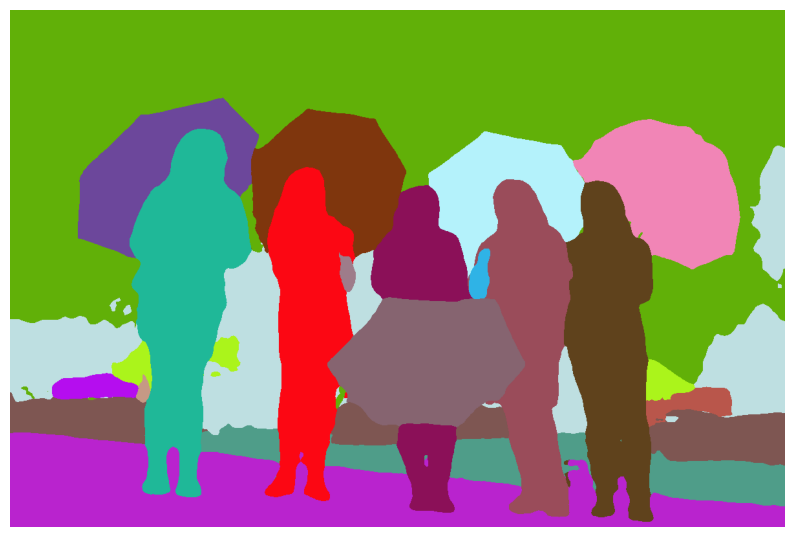

In [ ]:
import io
import requests
from PIL import Image
import torch
import numpy
import cv2
import random
import matplotlib.pyplot as plt

from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

url = "http://images.cocodataset.org/val2017/000000281759.jpg"
image = Image.open(requests.get(url, stream=True).raw)

feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# prepare image for the model
inputs = feature_extractor(images=image, return_tensors="pt")

# forward pass
outputs = model(**inputs)

# use the `post_process_panoptic` method of `DetrFeatureExtractor` to convert to COCO format
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)

# use a custom confidence threshold (e.g., 0.5)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.8)[0]

# the segmentation is stored in a special-format png
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
# retrieve the ids corresponding to each mask
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Get unique IDs from segmentation
unique_ids = numpy.unique(panoptic_seg_id)

# Assign random colors to each unique ID
id_to_color = {id_val: [random.randint(0, 255) for _ in range(3)] for id_val in unique_ids}

# Build a color mask image
color_mask = numpy.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=numpy.uint8)
for id_val, color in id_to_color.items():
    color_mask[panoptic_seg_id == id_val] = color

# Show result
plt.figure(figsize=(10, 10))
plt.imshow(color_mask)
plt.axis("off")
plt.show()

Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


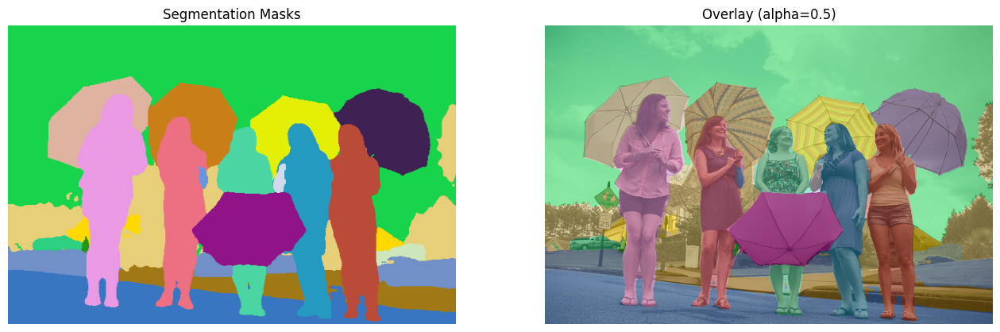

In [ ]:
import io
import requests
from PIL import Image
import torch
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

# Image URL
url = "http://images.cocodataset.org/val2017/000000281759.jpg"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# Prepare image
inputs = feature_extractor(images=image, return_tensors="pt")

# Forward pass
outputs = model(**inputs)

# Confidence threshold control
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.8)[0]

# Panoptic segmentation
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Assign random colors
unique_ids = np.unique(panoptic_seg_id)
id_to_color = {id_val: [random.randint(0, 255) for _ in range(3)] for id_val in unique_ids}

# Build color mask
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)
for id_val, color in id_to_color.items():
    color_mask[panoptic_seg_id == id_val] = color

# Ensure mask matches original image size
original_np = np.array(image)
color_mask = cv2.resize(color_mask, (original_np.shape[1], original_np.shape[0]), interpolation=cv2.INTER_NEAREST)

# Alpha blending overlay
alpha = 0.5  # transparency control
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# Plot side-by-side
plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)

plt.show()

Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


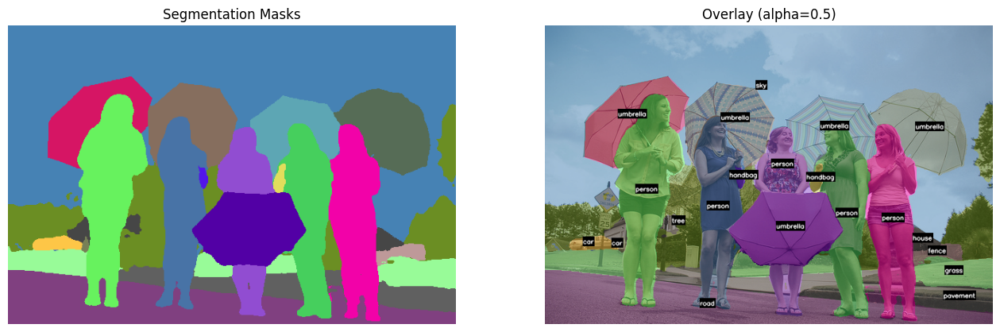

In [ ]:
import io
import requests
from PIL import Image
import torch
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

# --- Image ---
url = "http://images.cocodataset.org/val2017/000000281759.jpg"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

# --- Model ---
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# --- COCO categories list (shortened, use full 200+ in practice) ---
COCO_CATEGORIES = [
    {"color": [220, 20, 60], "isthing": 1, "id": 1, "name": "person"},
    {"color": [119, 11, 32], "isthing": 1, "id": 2, "name": "bicycle"},
    {"color": [0, 0, 142], "isthing": 1, "id": 3, "name": "car"},
    {"color": [0, 0, 230], "isthing": 1, "id": 4, "name": "motorcycle"},
    {"color": [106, 0, 228], "isthing": 1, "id": 5, "name": "airplane"},
    {"color": [0, 60, 100], "isthing": 1, "id": 6, "name": "bus"},
    {"color": [0, 80, 100], "isthing": 1, "id": 7, "name": "train"},
    {"color": [0, 0, 70], "isthing": 1, "id": 8, "name": "truck"},
    {"color": [0, 0, 192], "isthing": 1, "id": 9, "name": "boat"},
    {"color": [250, 170, 30], "isthing": 1, "id": 10, "name": "traffic light"},
    {"color": [100, 170, 30], "isthing": 1, "id": 11, "name": "fire hydrant"},
    {"color": [220, 220, 0], "isthing": 1, "id": 13, "name": "stop sign"},
    {"color": [175, 116, 175], "isthing": 1, "id": 14, "name": "parking meter"},
    {"color": [250, 0, 30], "isthing": 1, "id": 15, "name": "bench"},
    {"color": [165, 42, 42], "isthing": 1, "id": 16, "name": "bird"},
    {"color": [255, 77, 255], "isthing": 1, "id": 17, "name": "cat"},
    {"color": [0, 226, 252], "isthing": 1, "id": 18, "name": "dog"},
    {"color": [182, 182, 255], "isthing": 1, "id": 19, "name": "horse"},
    {"color": [0, 82, 0], "isthing": 1, "id": 20, "name": "sheep"},
    {"color": [120, 166, 157], "isthing": 1, "id": 21, "name": "cow"},
    {"color": [110, 76, 0], "isthing": 1, "id": 22, "name": "elephant"},
    {"color": [174, 57, 255], "isthing": 1, "id": 23, "name": "bear"},
    {"color": [199, 100, 0], "isthing": 1, "id": 24, "name": "zebra"},
    {"color": [72, 0, 118], "isthing": 1, "id": 25, "name": "giraffe"},
    {"color": [255, 179, 240], "isthing": 1, "id": 27, "name": "backpack"},
    {"color": [0, 125, 92], "isthing": 1, "id": 28, "name": "umbrella"},
    {"color": [209, 0, 151], "isthing": 1, "id": 31, "name": "handbag"},
    {"color": [188, 208, 182], "isthing": 1, "id": 32, "name": "tie"},
    {"color": [0, 220, 176], "isthing": 1, "id": 33, "name": "suitcase"},
    {"color": [255, 99, 164], "isthing": 1, "id": 34, "name": "frisbee"},
    {"color": [92, 0, 73], "isthing": 1, "id": 35, "name": "skis"},
    {"color": [133, 129, 255], "isthing": 1, "id": 36, "name": "snowboard"},
    {"color": [78, 180, 255], "isthing": 1, "id": 37, "name": "sports ball"},
    {"color": [0, 228, 0], "isthing": 1, "id": 38, "name": "kite"},
    {"color": [174, 255, 243], "isthing": 1, "id": 39, "name": "baseball bat"},
    {"color": [45, 89, 255], "isthing": 1, "id": 40, "name": "baseball glove"},
    {"color": [134, 134, 103], "isthing": 1, "id": 41, "name": "skateboard"},
    {"color": [145, 148, 174], "isthing": 1, "id": 42, "name": "surfboard"},
    {"color": [255, 208, 186], "isthing": 1, "id": 43, "name": "tennis racket"},
    {"color": [197, 226, 255], "isthing": 1, "id": 44, "name": "bottle"},
    {"color": [171, 134, 1], "isthing": 1, "id": 46, "name": "wine glass"},
    {"color": [109, 63, 54], "isthing": 1, "id": 47, "name": "cup"},
    {"color": [207, 138, 255], "isthing": 1, "id": 48, "name": "fork"},
    {"color": [151, 0, 95], "isthing": 1, "id": 49, "name": "knife"},
    {"color": [9, 80, 61], "isthing": 1, "id": 50, "name": "spoon"},
    {"color": [84, 105, 51], "isthing": 1, "id": 51, "name": "bowl"},
    {"color": [74, 65, 105], "isthing": 1, "id": 52, "name": "banana"},
    {"color": [166, 196, 102], "isthing": 1, "id": 53, "name": "apple"},
    {"color": [208, 195, 210], "isthing": 1, "id": 54, "name": "sandwich"},
    {"color": [255, 109, 65], "isthing": 1, "id": 55, "name": "orange"},
    {"color": [0, 143, 149], "isthing": 1, "id": 56, "name": "broccoli"},
    {"color": [179, 0, 194], "isthing": 1, "id": 57, "name": "carrot"},
    {"color": [209, 99, 106], "isthing": 1, "id": 58, "name": "hot dog"},
    {"color": [5, 121, 0], "isthing": 1, "id": 59, "name": "pizza"},
    {"color": [227, 255, 205], "isthing": 1, "id": 60, "name": "donut"},
    {"color": [147, 186, 208], "isthing": 1, "id": 61, "name": "cake"},
    {"color": [153, 69, 1], "isthing": 1, "id": 62, "name": "chair"},
    {"color": [3, 95, 161], "isthing": 1, "id": 63, "name": "couch"},
    {"color": [163, 255, 0], "isthing": 1, "id": 64, "name": "potted plant"},
    {"color": [119, 0, 170], "isthing": 1, "id": 65, "name": "bed"},
    {"color": [0, 182, 199], "isthing": 1, "id": 67, "name": "dining table"},
    {"color": [0, 165, 120], "isthing": 1, "id": 70, "name": "toilet"},
    {"color": [183, 130, 88], "isthing": 1, "id": 72, "name": "tv"},
    {"color": [95, 32, 0], "isthing": 1, "id": 73, "name": "laptop"},
    {"color": [130, 114, 135], "isthing": 1, "id": 74, "name": "mouse"},
    {"color": [110, 129, 133], "isthing": 1, "id": 75, "name": "remote"},
    {"color": [166, 74, 118], "isthing": 1, "id": 76, "name": "keyboard"},
    {"color": [219, 142, 185], "isthing": 1, "id": 77, "name": "cell phone"},
    {"color": [79, 210, 114], "isthing": 1, "id": 78, "name": "microwave"},
    {"color": [178, 90, 62], "isthing": 1, "id": 79, "name": "oven"},
    {"color": [65, 70, 15], "isthing": 1, "id": 80, "name": "toaster"},
    {"color": [127, 167, 115], "isthing": 1, "id": 81, "name": "sink"},
    {"color": [59, 105, 106], "isthing": 1, "id": 82, "name": "refrigerator"},
    {"color": [142, 108, 45], "isthing": 1, "id": 84, "name": "book"},
    {"color": [196, 172, 0], "isthing": 1, "id": 85, "name": "clock"},
    {"color": [95, 54, 80], "isthing": 1, "id": 86, "name": "vase"},
    {"color": [128, 76, 255], "isthing": 1, "id": 87, "name": "scissors"},
    {"color": [201, 57, 1], "isthing": 1, "id": 88, "name": "teddy bear"},
    {"color": [246, 0, 122], "isthing": 1, "id": 89, "name": "hair drier"},
    {"color": [191, 162, 208], "isthing": 1, "id": 90, "name": "toothbrush"},
    {"color": [255, 255, 128], "isthing": 0, "id": 92, "name": "banner"},
    {"color": [147, 211, 203], "isthing": 0, "id": 93, "name": "blanket"},
    {"color": [150, 100, 100], "isthing": 0, "id": 95, "name": "bridge"},
    {"color": [168, 171, 172], "isthing": 0, "id": 100, "name": "cardboard"},
    {"color": [146, 112, 198], "isthing": 0, "id": 107, "name": "counter"},
    {"color": [210, 170, 100], "isthing": 0, "id": 109, "name": "curtain"},
    {"color": [92, 136, 89], "isthing": 0, "id": 112, "name": "door-stuff"},
    {"color": [218, 88, 184], "isthing": 0, "id": 118, "name": "floor-wood"},
    {"color": [241, 129, 0], "isthing": 0, "id": 119, "name": "flower"},
    {"color": [217, 17, 255], "isthing": 0, "id": 122, "name": "fruit"},
    {"color": [124, 74, 181], "isthing": 0, "id": 125, "name": "gravel"},
    {"color": [70, 70, 70], "isthing": 0, "id": 128, "name": "house"},
    {"color": [255, 228, 255], "isthing": 0, "id": 130, "name": "light"},
    {"color": [154, 208, 0], "isthing": 0, "id": 133, "name": "mirror-stuff"},
    {"color": [193, 0, 92], "isthing": 0, "id": 138, "name": "net"},
    {"color": [76, 91, 113], "isthing": 0, "id": 141, "name": "pillow"},
    {"color": [255, 180, 195], "isthing": 0, "id": 144, "name": "platform"},
    {"color": [106, 154, 176], "isthing": 0, "id": 145, "name": "playingfield"},
    {"color": [230, 150, 140], "isthing": 0, "id": 147, "name": "railroad"},
    {"color": [60, 143, 255], "isthing": 0, "id": 148, "name": "river"},
    {"color": [128, 64, 128], "isthing": 0, "id": 149, "name": "road"},
    {"color": [92, 82, 55], "isthing": 0, "id": 151, "name": "roof"},
    {"color": [254, 212, 124], "isthing": 0, "id": 154, "name": "sand"},
    {"color": [73, 77, 174], "isthing": 0, "id": 155, "name": "sea"},
    {"color": [255, 160, 98], "isthing": 0, "id": 156, "name": "shelf"},
    {"color": [255, 255, 255], "isthing": 0, "id": 159, "name": "snow"},
    {"color": [104, 84, 109], "isthing": 0, "id": 161, "name": "stairs"},
    {"color": [169, 164, 131], "isthing": 0, "id": 166, "name": "tent"},
    {"color": [225, 199, 255], "isthing": 0, "id": 168, "name": "towel"},
    {"color": [137, 54, 74], "isthing": 0, "id": 171, "name": "wall-brick"},
    {"color": [135, 158, 223], "isthing": 0, "id": 175, "name": "wall-stone"},
    {"color": [7, 246, 231], "isthing": 0, "id": 176, "name": "wall-tile"},
    {"color": [107, 255, 200], "isthing": 0, "id": 177, "name": "wall-wood"},
    {"color": [58, 41, 149], "isthing": 0, "id": 178, "name": "water-other"},
    {"color": [183, 121, 142], "isthing": 0, "id": 180, "name": "window-blind"},
    {"color": [255, 73, 97], "isthing": 0, "id": 181, "name": "window-other"},
    {"color": [107, 142, 35], "isthing": 0, "id": 184, "name": "tree"},
    {"color": [190, 153, 153], "isthing": 0, "id": 185, "name": "fence"},
    {"color": [146, 139, 141], "isthing": 0, "id": 186, "name": "ceiling"},
    {"color": [70, 130, 180], "isthing": 0, "id": 187, "name": "sky"},
    {"color": [134, 199, 156], "isthing": 0, "id": 188, "name": "cabinet"},
    {"color": [209, 226, 140], "isthing": 0, "id": 189, "name": "table"},
    {"color": [96, 36, 108], "isthing": 0, "id": 190, "name": "floor"},
    {"color": [96, 96, 96], "isthing": 0, "id": 191, "name": "pavement"},
    {"color": [64, 170, 64], "isthing": 0, "id": 192, "name": "mountain"},
    {"color": [152, 251, 152], "isthing": 0, "id": 193, "name": "grass"},
    {"color": [208, 229, 228], "isthing": 0, "id": 194, "name": "dirt"},
    {"color": [206, 186, 171], "isthing": 0, "id": 195, "name": "paper"},
    {"color": [152, 161, 64], "isthing": 0, "id": 196, "name": "food"},
    {"color": [116, 112, 0], "isthing": 0, "id": 197, "name": "building"},
    {"color": [0, 114, 143], "isthing": 0, "id": 198, "name": "rock"},
    {"color": [102, 102, 156], "isthing": 0, "id": 199, "name": "wall"},
    {"color": [250, 141, 255], "isthing": 0, "id": 200, "name": "rug"},
]

COCO_BY_ID = {c["id"]: c for c in COCO_CATEGORIES}

# --- Forward pass ---
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.8)[0]

# --- Panoptic segmentation ---
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# --- Create color mask ---
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue

    mask = (panoptic_seg_id == segment_id)

    # Thing: random color per instance
    if cat["isthing"]:
        color = [random.randint(0, 255) for _ in range(3)]
    else:
        # Stuff: fixed COCO color
        color = cat["color"]

    color_mask[mask] = color

# --- Resize and overlay ---
original_np = np.array(image)
H, W = original_np.shape[:2]
color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

alpha = 0.5
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# --- Draw labels ---
for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue
    label_text = cat["name"]

    mask = (panoptic_id_resized == segment_id).astype(np.uint8)
    if mask.sum() == 0:
        continue

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cx, cy = centroids[largest_idx]
    cx = int(np.clip(cx, 0, W - 1))
    cy = int(np.clip(cy, 0, H - 1))

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.3
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
    rect_tl = (cx-15, cy - text_height - baseline)
    rect_br = (cx-15 + text_width, cy + baseline)
    rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
    rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

    cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
    cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)
plt.show()

Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


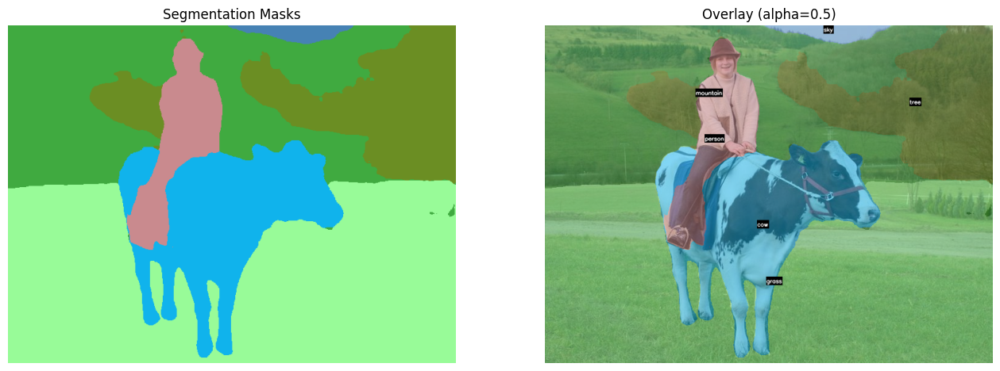

In [ ]:
import io
import requests
from PIL import Image
import torch
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

# --- Image ---
image_path = "datasets/vitpose_models/cow-riding.jpg"
image = Image.open(image_path).convert("RGB")

# --- Model ---
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# --- COCO categories list (shortened, use full 200+ in practice) ---
COCO_CATEGORIES = [
    {"color": [220, 20, 60], "isthing": 1, "id": 1, "name": "person"},
    {"color": [119, 11, 32], "isthing": 1, "id": 2, "name": "bicycle"},
    {"color": [0, 0, 142], "isthing": 1, "id": 3, "name": "car"},
    {"color": [0, 0, 230], "isthing": 1, "id": 4, "name": "motorcycle"},
    {"color": [106, 0, 228], "isthing": 1, "id": 5, "name": "airplane"},
    {"color": [0, 60, 100], "isthing": 1, "id": 6, "name": "bus"},
    {"color": [0, 80, 100], "isthing": 1, "id": 7, "name": "train"},
    {"color": [0, 0, 70], "isthing": 1, "id": 8, "name": "truck"},
    {"color": [0, 0, 192], "isthing": 1, "id": 9, "name": "boat"},
    {"color": [250, 170, 30], "isthing": 1, "id": 10, "name": "traffic light"},
    {"color": [100, 170, 30], "isthing": 1, "id": 11, "name": "fire hydrant"},
    {"color": [220, 220, 0], "isthing": 1, "id": 13, "name": "stop sign"},
    {"color": [175, 116, 175], "isthing": 1, "id": 14, "name": "parking meter"},
    {"color": [250, 0, 30], "isthing": 1, "id": 15, "name": "bench"},
    {"color": [165, 42, 42], "isthing": 1, "id": 16, "name": "bird"},
    {"color": [255, 77, 255], "isthing": 1, "id": 17, "name": "cat"},
    {"color": [0, 226, 252], "isthing": 1, "id": 18, "name": "dog"},
    {"color": [182, 182, 255], "isthing": 1, "id": 19, "name": "horse"},
    {"color": [0, 82, 0], "isthing": 1, "id": 20, "name": "sheep"},
    {"color": [120, 166, 157], "isthing": 1, "id": 21, "name": "cow"},
    {"color": [110, 76, 0], "isthing": 1, "id": 22, "name": "elephant"},
    {"color": [174, 57, 255], "isthing": 1, "id": 23, "name": "bear"},
    {"color": [199, 100, 0], "isthing": 1, "id": 24, "name": "zebra"},
    {"color": [72, 0, 118], "isthing": 1, "id": 25, "name": "giraffe"},
    {"color": [255, 179, 240], "isthing": 1, "id": 27, "name": "backpack"},
    {"color": [0, 125, 92], "isthing": 1, "id": 28, "name": "umbrella"},
    {"color": [209, 0, 151], "isthing": 1, "id": 31, "name": "handbag"},
    {"color": [188, 208, 182], "isthing": 1, "id": 32, "name": "tie"},
    {"color": [0, 220, 176], "isthing": 1, "id": 33, "name": "suitcase"},
    {"color": [255, 99, 164], "isthing": 1, "id": 34, "name": "frisbee"},
    {"color": [92, 0, 73], "isthing": 1, "id": 35, "name": "skis"},
    {"color": [133, 129, 255], "isthing": 1, "id": 36, "name": "snowboard"},
    {"color": [78, 180, 255], "isthing": 1, "id": 37, "name": "sports ball"},
    {"color": [0, 228, 0], "isthing": 1, "id": 38, "name": "kite"},
    {"color": [174, 255, 243], "isthing": 1, "id": 39, "name": "baseball bat"},
    {"color": [45, 89, 255], "isthing": 1, "id": 40, "name": "baseball glove"},
    {"color": [134, 134, 103], "isthing": 1, "id": 41, "name": "skateboard"},
    {"color": [145, 148, 174], "isthing": 1, "id": 42, "name": "surfboard"},
    {"color": [255, 208, 186], "isthing": 1, "id": 43, "name": "tennis racket"},
    {"color": [197, 226, 255], "isthing": 1, "id": 44, "name": "bottle"},
    {"color": [171, 134, 1], "isthing": 1, "id": 46, "name": "wine glass"},
    {"color": [109, 63, 54], "isthing": 1, "id": 47, "name": "cup"},
    {"color": [207, 138, 255], "isthing": 1, "id": 48, "name": "fork"},
    {"color": [151, 0, 95], "isthing": 1, "id": 49, "name": "knife"},
    {"color": [9, 80, 61], "isthing": 1, "id": 50, "name": "spoon"},
    {"color": [84, 105, 51], "isthing": 1, "id": 51, "name": "bowl"},
    {"color": [74, 65, 105], "isthing": 1, "id": 52, "name": "banana"},
    {"color": [166, 196, 102], "isthing": 1, "id": 53, "name": "apple"},
    {"color": [208, 195, 210], "isthing": 1, "id": 54, "name": "sandwich"},
    {"color": [255, 109, 65], "isthing": 1, "id": 55, "name": "orange"},
    {"color": [0, 143, 149], "isthing": 1, "id": 56, "name": "broccoli"},
    {"color": [179, 0, 194], "isthing": 1, "id": 57, "name": "carrot"},
    {"color": [209, 99, 106], "isthing": 1, "id": 58, "name": "hot dog"},
    {"color": [5, 121, 0], "isthing": 1, "id": 59, "name": "pizza"},
    {"color": [227, 255, 205], "isthing": 1, "id": 60, "name": "donut"},
    {"color": [147, 186, 208], "isthing": 1, "id": 61, "name": "cake"},
    {"color": [153, 69, 1], "isthing": 1, "id": 62, "name": "chair"},
    {"color": [3, 95, 161], "isthing": 1, "id": 63, "name": "couch"},
    {"color": [163, 255, 0], "isthing": 1, "id": 64, "name": "potted plant"},
    {"color": [119, 0, 170], "isthing": 1, "id": 65, "name": "bed"},
    {"color": [0, 182, 199], "isthing": 1, "id": 67, "name": "dining table"},
    {"color": [0, 165, 120], "isthing": 1, "id": 70, "name": "toilet"},
    {"color": [183, 130, 88], "isthing": 1, "id": 72, "name": "tv"},
    {"color": [95, 32, 0], "isthing": 1, "id": 73, "name": "laptop"},
    {"color": [130, 114, 135], "isthing": 1, "id": 74, "name": "mouse"},
    {"color": [110, 129, 133], "isthing": 1, "id": 75, "name": "remote"},
    {"color": [166, 74, 118], "isthing": 1, "id": 76, "name": "keyboard"},
    {"color": [219, 142, 185], "isthing": 1, "id": 77, "name": "cell phone"},
    {"color": [79, 210, 114], "isthing": 1, "id": 78, "name": "microwave"},
    {"color": [178, 90, 62], "isthing": 1, "id": 79, "name": "oven"},
    {"color": [65, 70, 15], "isthing": 1, "id": 80, "name": "toaster"},
    {"color": [127, 167, 115], "isthing": 1, "id": 81, "name": "sink"},
    {"color": [59, 105, 106], "isthing": 1, "id": 82, "name": "refrigerator"},
    {"color": [142, 108, 45], "isthing": 1, "id": 84, "name": "book"},
    {"color": [196, 172, 0], "isthing": 1, "id": 85, "name": "clock"},
    {"color": [95, 54, 80], "isthing": 1, "id": 86, "name": "vase"},
    {"color": [128, 76, 255], "isthing": 1, "id": 87, "name": "scissors"},
    {"color": [201, 57, 1], "isthing": 1, "id": 88, "name": "teddy bear"},
    {"color": [246, 0, 122], "isthing": 1, "id": 89, "name": "hair drier"},
    {"color": [191, 162, 208], "isthing": 1, "id": 90, "name": "toothbrush"},
    {"color": [255, 255, 128], "isthing": 0, "id": 92, "name": "banner"},
    {"color": [147, 211, 203], "isthing": 0, "id": 93, "name": "blanket"},
    {"color": [150, 100, 100], "isthing": 0, "id": 95, "name": "bridge"},
    {"color": [168, 171, 172], "isthing": 0, "id": 100, "name": "cardboard"},
    {"color": [146, 112, 198], "isthing": 0, "id": 107, "name": "counter"},
    {"color": [210, 170, 100], "isthing": 0, "id": 109, "name": "curtain"},
    {"color": [92, 136, 89], "isthing": 0, "id": 112, "name": "door-stuff"},
    {"color": [218, 88, 184], "isthing": 0, "id": 118, "name": "floor-wood"},
    {"color": [241, 129, 0], "isthing": 0, "id": 119, "name": "flower"},
    {"color": [217, 17, 255], "isthing": 0, "id": 122, "name": "fruit"},
    {"color": [124, 74, 181], "isthing": 0, "id": 125, "name": "gravel"},
    {"color": [70, 70, 70], "isthing": 0, "id": 128, "name": "house"},
    {"color": [255, 228, 255], "isthing": 0, "id": 130, "name": "light"},
    {"color": [154, 208, 0], "isthing": 0, "id": 133, "name": "mirror-stuff"},
    {"color": [193, 0, 92], "isthing": 0, "id": 138, "name": "net"},
    {"color": [76, 91, 113], "isthing": 0, "id": 141, "name": "pillow"},
    {"color": [255, 180, 195], "isthing": 0, "id": 144, "name": "platform"},
    {"color": [106, 154, 176], "isthing": 0, "id": 145, "name": "playingfield"},
    {"color": [230, 150, 140], "isthing": 0, "id": 147, "name": "railroad"},
    {"color": [60, 143, 255], "isthing": 0, "id": 148, "name": "river"},
    {"color": [128, 64, 128], "isthing": 0, "id": 149, "name": "road"},
    {"color": [92, 82, 55], "isthing": 0, "id": 151, "name": "roof"},
    {"color": [254, 212, 124], "isthing": 0, "id": 154, "name": "sand"},
    {"color": [73, 77, 174], "isthing": 0, "id": 155, "name": "sea"},
    {"color": [255, 160, 98], "isthing": 0, "id": 156, "name": "shelf"},
    {"color": [255, 255, 255], "isthing": 0, "id": 159, "name": "snow"},
    {"color": [104, 84, 109], "isthing": 0, "id": 161, "name": "stairs"},
    {"color": [169, 164, 131], "isthing": 0, "id": 166, "name": "tent"},
    {"color": [225, 199, 255], "isthing": 0, "id": 168, "name": "towel"},
    {"color": [137, 54, 74], "isthing": 0, "id": 171, "name": "wall-brick"},
    {"color": [135, 158, 223], "isthing": 0, "id": 175, "name": "wall-stone"},
    {"color": [7, 246, 231], "isthing": 0, "id": 176, "name": "wall-tile"},
    {"color": [107, 255, 200], "isthing": 0, "id": 177, "name": "wall-wood"},
    {"color": [58, 41, 149], "isthing": 0, "id": 178, "name": "water-other"},
    {"color": [183, 121, 142], "isthing": 0, "id": 180, "name": "window-blind"},
    {"color": [255, 73, 97], "isthing": 0, "id": 181, "name": "window-other"},
    {"color": [107, 142, 35], "isthing": 0, "id": 184, "name": "tree"},
    {"color": [190, 153, 153], "isthing": 0, "id": 185, "name": "fence"},
    {"color": [146, 139, 141], "isthing": 0, "id": 186, "name": "ceiling"},
    {"color": [70, 130, 180], "isthing": 0, "id": 187, "name": "sky"},
    {"color": [134, 199, 156], "isthing": 0, "id": 188, "name": "cabinet"},
    {"color": [209, 226, 140], "isthing": 0, "id": 189, "name": "table"},
    {"color": [96, 36, 108], "isthing": 0, "id": 190, "name": "floor"},
    {"color": [96, 96, 96], "isthing": 0, "id": 191, "name": "pavement"},
    {"color": [64, 170, 64], "isthing": 0, "id": 192, "name": "mountain"},
    {"color": [152, 251, 152], "isthing": 0, "id": 193, "name": "grass"},
    {"color": [208, 229, 228], "isthing": 0, "id": 194, "name": "dirt"},
    {"color": [206, 186, 171], "isthing": 0, "id": 195, "name": "paper"},
    {"color": [152, 161, 64], "isthing": 0, "id": 196, "name": "food"},
    {"color": [116, 112, 0], "isthing": 0, "id": 197, "name": "building"},
    {"color": [0, 114, 143], "isthing": 0, "id": 198, "name": "rock"},
    {"color": [102, 102, 156], "isthing": 0, "id": 199, "name": "wall"},
    {"color": [250, 141, 255], "isthing": 0, "id": 200, "name": "rug"},
]

COCO_BY_ID = {c["id"]: c for c in COCO_CATEGORIES}

# --- Forward pass ---
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.8)[0]

# --- Panoptic segmentation ---
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# --- Create color mask ---
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue

    mask = (panoptic_seg_id == segment_id)

    # Thing: random color per instance
    if cat["isthing"]:
        color = [random.randint(0, 255) for _ in range(3)]
    else:
        # Stuff: fixed COCO color
        color = cat["color"]

    color_mask[mask] = color

# --- Resize and overlay ---
original_np = np.array(image)
H, W = original_np.shape[:2]
color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

alpha = 0.5
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# --- Draw labels ---
for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue
    label_text = cat["name"]

    mask = (panoptic_id_resized == segment_id).astype(np.uint8)
    if mask.sum() == 0:
        continue

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cx, cy = centroids[largest_idx]
    cx = int(np.clip(cx, 0, W - 1))
    cy = int(np.clip(cy, 0, H - 1))

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.3
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
    rect_tl = (cx-15, cy - text_height - baseline)
    rect_br = (cx-15 + text_width, cy + baseline)
    rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
    rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

    cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
    cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)
plt.show()

In [3]:
import io
import requests
from PIL import Image
import torch
import numpy as np
import cv2
import random
import os
import matplotlib.pyplot as plt

from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

device = "cuda" if torch.cuda.is_available() else "cpu"
# --- Model ---
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-101-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-101-panoptic", device_map=device)

# --- COCO categories list (shortened, use full 200+ in practice) ---
COCO_CATEGORIES = [
    {"color": [220, 20, 60], "isthing": 1, "id": 1, "name": "person"},
    {"color": [119, 11, 32], "isthing": 1, "id": 2, "name": "bicycle"},
    {"color": [0, 0, 142], "isthing": 1, "id": 3, "name": "car"},
    {"color": [0, 0, 230], "isthing": 1, "id": 4, "name": "motorcycle"},
    {"color": [106, 0, 228], "isthing": 1, "id": 5, "name": "airplane"},
    {"color": [0, 60, 100], "isthing": 1, "id": 6, "name": "bus"},
    {"color": [0, 80, 100], "isthing": 1, "id": 7, "name": "train"},
    {"color": [0, 0, 70], "isthing": 1, "id": 8, "name": "truck"},
    {"color": [0, 0, 192], "isthing": 1, "id": 9, "name": "boat"},
    {"color": [250, 170, 30], "isthing": 1, "id": 10, "name": "traffic light"},
    {"color": [100, 170, 30], "isthing": 1, "id": 11, "name": "fire hydrant"},
    {"color": [220, 220, 0], "isthing": 1, "id": 13, "name": "stop sign"},
    {"color": [175, 116, 175], "isthing": 1, "id": 14, "name": "parking meter"},
    {"color": [250, 0, 30], "isthing": 1, "id": 15, "name": "bench"},
    {"color": [165, 42, 42], "isthing": 1, "id": 16, "name": "bird"},
    {"color": [255, 77, 255], "isthing": 1, "id": 17, "name": "cat"},
    {"color": [0, 226, 252], "isthing": 1, "id": 18, "name": "dog"},
    {"color": [182, 182, 255], "isthing": 1, "id": 19, "name": "horse"},
    {"color": [0, 82, 0], "isthing": 1, "id": 20, "name": "sheep"},
    {"color": [120, 166, 157], "isthing": 1, "id": 21, "name": "cow"},
    {"color": [110, 76, 0], "isthing": 1, "id": 22, "name": "elephant"},
    {"color": [174, 57, 255], "isthing": 1, "id": 23, "name": "bear"},
    {"color": [199, 100, 0], "isthing": 1, "id": 24, "name": "zebra"},
    {"color": [72, 0, 118], "isthing": 1, "id": 25, "name": "giraffe"},
    {"color": [255, 179, 240], "isthing": 1, "id": 27, "name": "backpack"},
    {"color": [0, 125, 92], "isthing": 1, "id": 28, "name": "umbrella"},
    {"color": [209, 0, 151], "isthing": 1, "id": 31, "name": "handbag"},
    {"color": [188, 208, 182], "isthing": 1, "id": 32, "name": "tie"},
    {"color": [0, 220, 176], "isthing": 1, "id": 33, "name": "suitcase"},
    {"color": [255, 99, 164], "isthing": 1, "id": 34, "name": "frisbee"},
    {"color": [92, 0, 73], "isthing": 1, "id": 35, "name": "skis"},
    {"color": [133, 129, 255], "isthing": 1, "id": 36, "name": "snowboard"},
    {"color": [78, 180, 255], "isthing": 1, "id": 37, "name": "sports ball"},
    {"color": [0, 228, 0], "isthing": 1, "id": 38, "name": "kite"},
    {"color": [174, 255, 243], "isthing": 1, "id": 39, "name": "baseball bat"},
    {"color": [45, 89, 255], "isthing": 1, "id": 40, "name": "baseball glove"},
    {"color": [134, 134, 103], "isthing": 1, "id": 41, "name": "skateboard"},
    {"color": [145, 148, 174], "isthing": 1, "id": 42, "name": "surfboard"},
    {"color": [255, 208, 186], "isthing": 1, "id": 43, "name": "tennis racket"},
    {"color": [197, 226, 255], "isthing": 1, "id": 44, "name": "bottle"},
    {"color": [171, 134, 1], "isthing": 1, "id": 46, "name": "wine glass"},
    {"color": [109, 63, 54], "isthing": 1, "id": 47, "name": "cup"},
    {"color": [207, 138, 255], "isthing": 1, "id": 48, "name": "fork"},
    {"color": [151, 0, 95], "isthing": 1, "id": 49, "name": "knife"},
    {"color": [9, 80, 61], "isthing": 1, "id": 50, "name": "spoon"},
    {"color": [84, 105, 51], "isthing": 1, "id": 51, "name": "bowl"},
    {"color": [74, 65, 105], "isthing": 1, "id": 52, "name": "banana"},
    {"color": [166, 196, 102], "isthing": 1, "id": 53, "name": "apple"},
    {"color": [208, 195, 210], "isthing": 1, "id": 54, "name": "sandwich"},
    {"color": [255, 109, 65], "isthing": 1, "id": 55, "name": "orange"},
    {"color": [0, 143, 149], "isthing": 1, "id": 56, "name": "broccoli"},
    {"color": [179, 0, 194], "isthing": 1, "id": 57, "name": "carrot"},
    {"color": [209, 99, 106], "isthing": 1, "id": 58, "name": "hot dog"},
    {"color": [5, 121, 0], "isthing": 1, "id": 59, "name": "pizza"},
    {"color": [227, 255, 205], "isthing": 1, "id": 60, "name": "donut"},
    {"color": [147, 186, 208], "isthing": 1, "id": 61, "name": "cake"},
    {"color": [153, 69, 1], "isthing": 1, "id": 62, "name": "chair"},
    {"color": [3, 95, 161], "isthing": 1, "id": 63, "name": "couch"},
    {"color": [163, 255, 0], "isthing": 1, "id": 64, "name": "potted plant"},
    {"color": [119, 0, 170], "isthing": 1, "id": 65, "name": "bed"},
    {"color": [0, 182, 199], "isthing": 1, "id": 67, "name": "dining table"},
    {"color": [0, 165, 120], "isthing": 1, "id": 70, "name": "toilet"},
    {"color": [183, 130, 88], "isthing": 1, "id": 72, "name": "tv"},
    {"color": [95, 32, 0], "isthing": 1, "id": 73, "name": "laptop"},
    {"color": [130, 114, 135], "isthing": 1, "id": 74, "name": "mouse"},
    {"color": [110, 129, 133], "isthing": 1, "id": 75, "name": "remote"},
    {"color": [166, 74, 118], "isthing": 1, "id": 76, "name": "keyboard"},
    {"color": [219, 142, 185], "isthing": 1, "id": 77, "name": "cell phone"},
    {"color": [79, 210, 114], "isthing": 1, "id": 78, "name": "microwave"},
    {"color": [178, 90, 62], "isthing": 1, "id": 79, "name": "oven"},
    {"color": [65, 70, 15], "isthing": 1, "id": 80, "name": "toaster"},
    {"color": [127, 167, 115], "isthing": 1, "id": 81, "name": "sink"},
    {"color": [59, 105, 106], "isthing": 1, "id": 82, "name": "refrigerator"},
    {"color": [142, 108, 45], "isthing": 1, "id": 84, "name": "book"},
    {"color": [196, 172, 0], "isthing": 1, "id": 85, "name": "clock"},
    {"color": [95, 54, 80], "isthing": 1, "id": 86, "name": "vase"},
    {"color": [128, 76, 255], "isthing": 1, "id": 87, "name": "scissors"},
    {"color": [201, 57, 1], "isthing": 1, "id": 88, "name": "teddy bear"},
    {"color": [246, 0, 122], "isthing": 1, "id": 89, "name": "hair drier"},
    {"color": [191, 162, 208], "isthing": 1, "id": 90, "name": "toothbrush"},
    {"color": [255, 255, 128], "isthing": 0, "id": 92, "name": "banner"},
    {"color": [147, 211, 203], "isthing": 0, "id": 93, "name": "blanket"},
    {"color": [150, 100, 100], "isthing": 0, "id": 95, "name": "bridge"},
    {"color": [168, 171, 172], "isthing": 0, "id": 100, "name": "cardboard"},
    {"color": [146, 112, 198], "isthing": 0, "id": 107, "name": "counter"},
    {"color": [210, 170, 100], "isthing": 0, "id": 109, "name": "curtain"},
    {"color": [92, 136, 89], "isthing": 0, "id": 112, "name": "door-stuff"},
    {"color": [218, 88, 184], "isthing": 0, "id": 118, "name": "floor-wood"},
    {"color": [241, 129, 0], "isthing": 0, "id": 119, "name": "flower"},
    {"color": [217, 17, 255], "isthing": 0, "id": 122, "name": "fruit"},
    {"color": [124, 74, 181], "isthing": 0, "id": 125, "name": "gravel"},
    {"color": [70, 70, 70], "isthing": 0, "id": 128, "name": "house"},
    {"color": [255, 228, 255], "isthing": 0, "id": 130, "name": "light"},
    {"color": [154, 208, 0], "isthing": 0, "id": 133, "name": "mirror-stuff"},
    {"color": [193, 0, 92], "isthing": 0, "id": 138, "name": "net"},
    {"color": [76, 91, 113], "isthing": 0, "id": 141, "name": "pillow"},
    {"color": [255, 180, 195], "isthing": 0, "id": 144, "name": "platform"},
    {"color": [106, 154, 176], "isthing": 0, "id": 145, "name": "playingfield"},
    {"color": [230, 150, 140], "isthing": 0, "id": 147, "name": "railroad"},
    {"color": [60, 143, 255], "isthing": 0, "id": 148, "name": "river"},
    {"color": [128, 64, 128], "isthing": 0, "id": 149, "name": "road"},
    {"color": [92, 82, 55], "isthing": 0, "id": 151, "name": "roof"},
    {"color": [254, 212, 124], "isthing": 0, "id": 154, "name": "sand"},
    {"color": [73, 77, 174], "isthing": 0, "id": 155, "name": "sea"},
    {"color": [255, 160, 98], "isthing": 0, "id": 156, "name": "shelf"},
    {"color": [255, 255, 255], "isthing": 0, "id": 159, "name": "snow"},
    {"color": [104, 84, 109], "isthing": 0, "id": 161, "name": "stairs"},
    {"color": [169, 164, 131], "isthing": 0, "id": 166, "name": "tent"},
    {"color": [225, 199, 255], "isthing": 0, "id": 168, "name": "towel"},
    {"color": [137, 54, 74], "isthing": 0, "id": 171, "name": "wall-brick"},
    {"color": [135, 158, 223], "isthing": 0, "id": 175, "name": "wall-stone"},
    {"color": [7, 246, 231], "isthing": 0, "id": 176, "name": "wall-tile"},
    {"color": [107, 255, 200], "isthing": 0, "id": 177, "name": "wall-wood"},
    {"color": [58, 41, 149], "isthing": 0, "id": 178, "name": "water-other"},
    {"color": [183, 121, 142], "isthing": 0, "id": 180, "name": "window-blind"},
    {"color": [255, 73, 97], "isthing": 0, "id": 181, "name": "window-other"},
    {"color": [107, 142, 35], "isthing": 0, "id": 184, "name": "tree"},
    {"color": [190, 153, 153], "isthing": 0, "id": 185, "name": "fence"},
    {"color": [146, 139, 141], "isthing": 0, "id": 186, "name": "ceiling"},
    {"color": [70, 130, 180], "isthing": 0, "id": 187, "name": "sky"},
    {"color": [134, 199, 156], "isthing": 0, "id": 188, "name": "cabinet"},
    {"color": [209, 226, 140], "isthing": 0, "id": 189, "name": "table"},
    {"color": [96, 36, 108], "isthing": 0, "id": 190, "name": "floor"},
    {"color": [96, 96, 96], "isthing": 0, "id": 191, "name": "pavement"},
    {"color": [64, 170, 64], "isthing": 0, "id": 192, "name": "mountain"},
    {"color": [152, 251, 152], "isthing": 0, "id": 193, "name": "grass"},
    {"color": [208, 229, 228], "isthing": 0, "id": 194, "name": "dirt"},
    {"color": [206, 186, 171], "isthing": 0, "id": 195, "name": "paper"},
    {"color": [152, 161, 64], "isthing": 0, "id": 196, "name": "food"},
    {"color": [116, 112, 0], "isthing": 0, "id": 197, "name": "building"},
    {"color": [0, 114, 143], "isthing": 0, "id": 198, "name": "rock"},
    {"color": [102, 102, 156], "isthing": 0, "id": 199, "name": "wall"},
    {"color": [250, 141, 255], "isthing": 0, "id": 200, "name": "rug"},
]

COCO_BY_ID = {c["id"]: c for c in COCO_CATEGORIES}

Some weights of the model checkpoint at facebook/detr-resnet-101-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


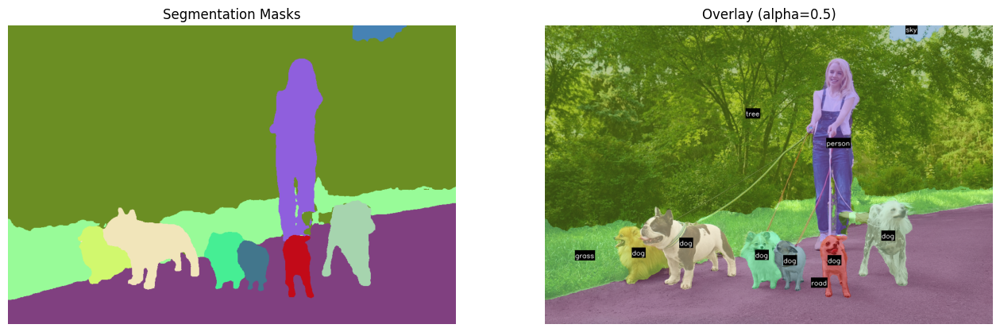

In [8]:
# --- Image ---
image_path = "datasets/vitpose_models/family.jpg"
image = Image.open(image_path).convert("RGB")

# --- Forward pass ---
inputs = feature_extractor(images=image, return_tensors="pt").to(device)
outputs = model(**inputs)
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.5)[0]

# --- Panoptic segmentation ---
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# --- Create color mask ---
color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue

    mask = (panoptic_seg_id == segment_id)

    # Thing: random color per instance
    if cat["isthing"]:
        color = [random.randint(0, 255) for _ in range(3)]
    else:
        # Stuff: fixed COCO color
        color = cat["color"]

    color_mask[mask] = color

# --- Resize and overlay ---
original_np = np.array(image)
H, W = original_np.shape[:2]
color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

alpha = 0.5
overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

# --- Draw labels ---
for seg_info in result["segments_info"]:
    segment_id = seg_info["id"]
    category_id = seg_info["category_id"]
    cat = COCO_BY_ID.get(category_id, None)
    if cat is None:
        continue
    label_text = cat["name"]

    mask = (panoptic_id_resized == segment_id).astype(np.uint8)
    if mask.sum() == 0:
        continue

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cx, cy = centroids[largest_idx]
    cx = int(np.clip(cx, 0, W - 1))
    cy = int(np.clip(cy, 0, H - 1))

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.5
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
    rect_tl = (cx-15, cy - text_height - baseline)
    rect_br = (cx-15 + text_width, cy + baseline)
    rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
    rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

    cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
    cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# --- Display ---
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.title('Segmentation Masks')
plt.axis('off')
plt.imshow(color_mask)

plt.subplot(1, 2, 2)
plt.title(f'Overlay (alpha={alpha})')
plt.axis('off')
plt.imshow(overlay_np)
plt.show()

With detr-resnet-101-panoptic,

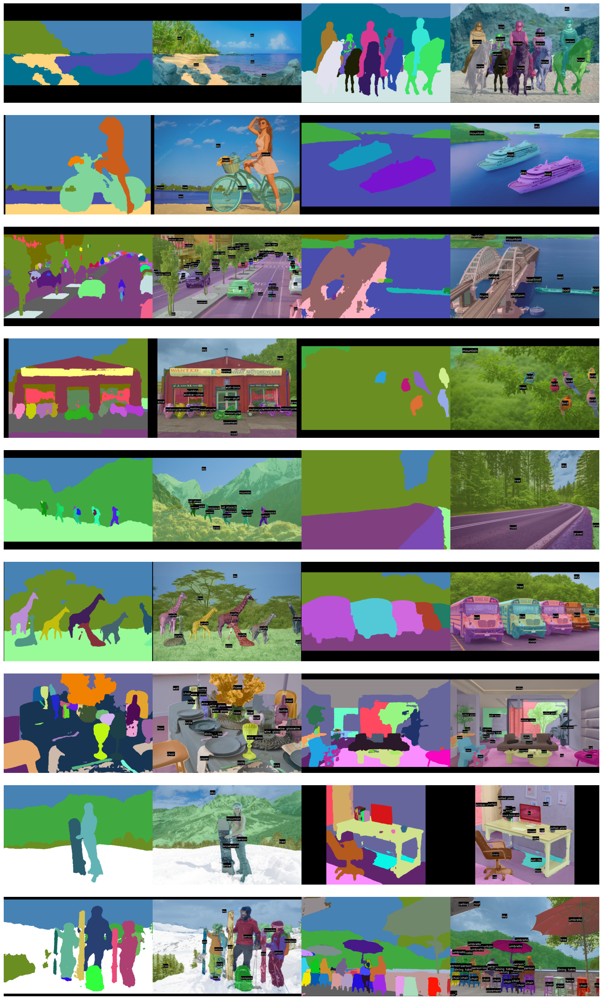

In [9]:
val_dir = "datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    # --- Forward pass ---
    inputs = feature_extractor(images=image, return_tensors="pt").to(device)
    outputs = model(**inputs)
    processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
    result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.5)[0]

    # --- Panoptic segmentation ---
    panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
    panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
    panoptic_seg_id = rgb_to_id(panoptic_seg)

    # --- Create color mask ---
    color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        category_id = seg_info["category_id"]
        cat = COCO_BY_ID.get(category_id, None)
        if cat is None:
            continue

        mask = (panoptic_seg_id == segment_id)

        # Thing: random color per instance
        if cat["isthing"]:
            color = [random.randint(0, 255) for _ in range(3)]
        else:
            # Stuff: fixed COCO color
            color = cat["color"]

        color_mask[mask] = color

    # --- Resize and overlay ---
    original_np = np.array(image)
    H, W = original_np.shape[:2]
    color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

    alpha = 0.5
    overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

    # --- Draw labels ---
    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        category_id = seg_info["category_id"]
        cat = COCO_BY_ID.get(category_id, None)
        if cat is None:
            continue
        label_text = cat["name"]

        mask = (panoptic_id_resized == segment_id).astype(np.uint8)
        if mask.sum() == 0:
            continue

        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
        largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        cx, cy = centroids[largest_idx]
        cx = int(np.clip(cx, 0, W - 1))
        cy = int(np.clip(cy, 0, H - 1))

        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
        rect_tl = (cx-15, cy - text_height - baseline)
        rect_br = (cx-15 + text_width, cy + baseline)
        rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
        rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

        cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
        cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

    processed_imgs.append((color_mask, overlay_np))
    img_sizes.append(overlay_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

With detr-resnet-50-panoptic,

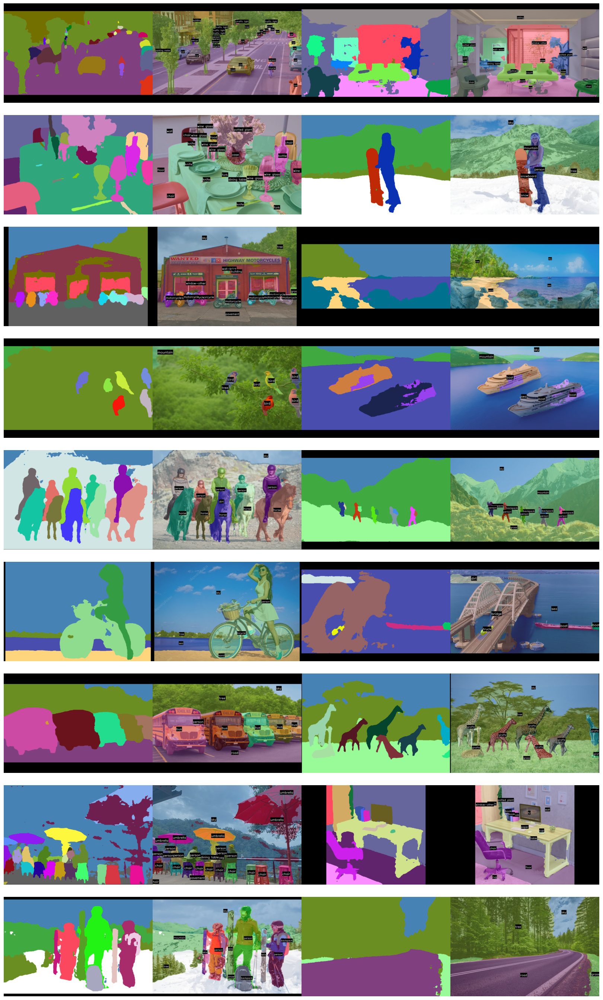

In [ ]:
val_dir = "datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    # --- Forward pass ---
    inputs = feature_extractor(images=image, return_tensors="pt").to(device)
    outputs = model(**inputs)
    processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
    result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.8)[0]

    # --- Panoptic segmentation ---
    panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
    panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
    panoptic_seg_id = rgb_to_id(panoptic_seg)

    # --- Create color mask ---
    color_mask = np.zeros((panoptic_seg_id.shape[0], panoptic_seg_id.shape[1], 3), dtype=np.uint8)

    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        category_id = seg_info["category_id"]
        cat = COCO_BY_ID.get(category_id, None)
        if cat is None:
            continue

        mask = (panoptic_seg_id == segment_id)

        # Thing: random color per instance
        if cat["isthing"]:
            color = [random.randint(0, 255) for _ in range(3)]
        else:
            # Stuff: fixed COCO color
            color = cat["color"]

        color_mask[mask] = color

    # --- Resize and overlay ---
    original_np = np.array(image)
    H, W = original_np.shape[:2]
    color_mask = cv2.resize(color_mask, (W, H), interpolation=cv2.INTER_NEAREST)
    panoptic_id_resized = cv2.resize(panoptic_seg_id, (W, H), interpolation=cv2.INTER_NEAREST)

    alpha = 0.5
    overlay_np = cv2.addWeighted(original_np, 1 - alpha, color_mask, alpha, 0)

    # --- Draw labels ---
    for seg_info in result["segments_info"]:
        segment_id = seg_info["id"]
        category_id = seg_info["category_id"]
        cat = COCO_BY_ID.get(category_id, None)
        if cat is None:
            continue
        label_text = cat["name"]

        mask = (panoptic_id_resized == segment_id).astype(np.uint8)
        if mask.sum() == 0:
            continue

        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)
        largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        cx, cy = centroids[largest_idx]
        cx = int(np.clip(cx, 0, W - 1))
        cy = int(np.clip(cy, 0, H - 1))

        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)
        rect_tl = (cx-15, cy - text_height - baseline)
        rect_br = (cx-15 + text_width, cy + baseline)
        rect_tl = (max(rect_tl[0], 0), max(rect_tl[1], 0))
        rect_br = (min(rect_br[0], W - 1), min(rect_br[1], H - 1))

        cv2.rectangle(overlay_np, rect_tl, rect_br, (0, 0, 0), cv2.FILLED)
        cv2.putText(overlay_np, label_text, (cx-15, cy), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

    processed_imgs.append((color_mask, overlay_np))
    img_sizes.append(overlay_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()